In [ ]:
###########################################################
## Using my FineST conda envirment on GPU2 with py3.8.20
## 2025.05.16 Try Breast cancer dataset using PRS score
## 2025.09.25 Test OncotypeDX21 score and MammaPrint score

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

In [ ]:
## setting
plt.rcParams.update({
    "font.family": 'sans-serif',      # Set the global font to sans-serif
    "mathtext.fontset": 'stix',       # Set math font to STIX (similar to Times New Roman math symbols)
    "font.size": 12,                  # Set the global font size to 12
    'pdf.fonttype': 42,               # Set font type to 42 (TrueType) when saving PDFs to ensure editable text
})
## plot
import matplotlib.colors as clr
cnt_color = clr.LinearSegmentedColormap.from_list('magma', ["#000003",  "#3b0f6f",  "#8c2980",   "#f66e5b", "#fd9f6c", "#fbfcbf"], N=256)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
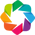

FineST version: 0.1.1


In [ ]:
## From GPU2
import FineST as fst
print("FineST version: %s" %fst.__version__)

In [4]:
import os
# path = '/Users/lilingyu/E/PhD/Python/'
# path = '/storage3/yhhuang/users/lingyu/'
# path = '/data/users/lingyu/'
# path = '/home/lly/Python/'
path = '/mnt/lingyu/nfs_share2/Python/'

## PRS Score

PRS = 0.197 ∗ EGR1 + 0.120 ∗ IGFBP5 − 0.130 ∗ JUN + 0.155 ∗ MAFK − 0.099 ∗ MYC − 0.109 ∗ TCF7,

In [6]:
gene_marker = pd.DataFrame(['EGR1', 'IGFBP5', 'JUN', 'MAFK', 'MYC', 'TCF7'], columns=['PRSmarker']) 
gene_marker

gene_weights = {
    'EGR1': 0.197,
    'IGFBP5': 0.120,
    'JUN': -0.130,
    'MAFK': 0.155,
    'MYC': -0.099,
    'TCF7': -0.109
}

In [ ]:
def meta_score(adata, gene_weights, score_name):
    if hasattr(adata, 'to_df'):
        adata_df = adata.to_df()
    else:
        adata_df = adata

    ## if all specified genes are in the data
    gene_overlap = [gene for gene in gene_weights if gene in adata_df.columns]
    # if len(gene_overlap) != len(gene_weights):
    #     missing_genes = set(gene_weights.keys()) - set(gene_overlap)
    #     raise ValueError(f"Missing genes in the dataset: {missing_genes}")
    
    if len(gene_overlap) == 0:
        raise ValueError("No specified genes found in the dataset.")
    gene_weights = {gene: gene_weights[gene] for gene in gene_overlap}


    ## weighted score based on the provided gene weights
    score = adata_df[gene_overlap].apply(
        lambda x: sum(x[gene] * weight for gene, weight in gene_weights.items() if gene in gene_overlap), axis=1
    )
    
    ## scale [0, 1]
    score_norm = (score - score.min()) / (score.max() - score.min())

    return pd.DataFrame(score, columns=[score_name]), pd.DataFrame(score_norm, columns=[f"{score_name}_norm"])

## 10X Visium

### Annotation

In [8]:
anno = pd.read_excel(f'{path}/iSTAR/GSE243275/Cell_Barcode_Type_Matrices.xlsx', 
                     sheet_name='Visium', index_col=0) 
anno

,Cluster,Annotation
Barcode,,
AACACCTACTATCGAA-1,1,stromal/endothelial
AACACGTGCATCGCAC-1,5,stromal/endothelial
AACACTTGGCAAGGAA-1,12,mixed
AACAGGAAGAGCATAG-1,2,stromal/endothelial/immune
AACAGGATTCATAGTT-1,5,stromal/endothelial
...,...,...
TGTTGGAACGAGGTCA-1,8,stromal
TGTTGGAAGCTCGGTA-1,9,immune
TGTTGGATGGACTTCT-1,4,invasive


### Visium

In [9]:
import os
os.chdir(str(path)+'Xenium/xenium-publication/')
InputFile = "visium"
## 4992 × 18085
adata = sc.read_visium(str(InputFile))
print(adata)

## normalized
adata_count = adata.copy()
adata = fst.adata_preprocess(adata_count, keep_raw=True, normalize=True, min_cells=10)
print(adata)

adata.to_df().head()

AnnData object with n_obs × n_vars = 4992 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 4992 × 18031
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial', 'log1p'
    obsm: 'spatial'


,SAMD11,NOC2L,KLHL17,PLEKHN1,PERM1,HES4,ISG15,AGRN,RNF223,C1orf159,...,MT-ND2,MT-CO2,MT-ATP6,MT-CO3,MT-ND3,MT-ND4L,MT-ND4,MT-ND5,MT-ND6,MT-CYB
AACACCTACTATCGAA-1,0.000000,0.00000,0.0,0.000000,0.0,0.726395,0.000000,0.726395,0.0,0.0,...,3.976181,4.158714,2.136919,4.395325,3.240837,4.124776,4.124776,3.106928,2.834048,3.777452
AACACGTGCATCGCAC-1,1.488829,0.00000,0.0,0.000000,0.0,0.000000,0.000000,2.062271,0.0,0.0,...,3.286134,3.781887,1.488829,4.243312,2.799935,4.166514,3.742014,1.816103,2.689724,3.742014
AACACTTGGCAAGGAA-1,0.347069,0.80859,0.0,0.347069,0.0,0.808590,2.273485,1.638829,0.0,0.0,...,2.979152,3.456431,2.033217,4.332040,2.957834,3.579421,3.739489,2.033217,2.467062,3.469434
AACAGGAAGAGCATAG-1,0.000000,0.00000,0.0,0.000000,0.0,0.000000,1.529582,1.529582,0.0,0.0,...,3.908403,3.708161,2.306639,4.343041,3.122254,4.043961,3.751546,2.849151,2.472222,3.615300
AACAGGATTCATAGTT-1,0.000000,0.00000,0.0,0.000000,0.0,1.105757,1.105757,1.105757,0.0,0.0,...,3.902302,4.328045,1.955087,4.900968,2.574829,4.683428,4.354366,2.843286,2.407626,3.771651


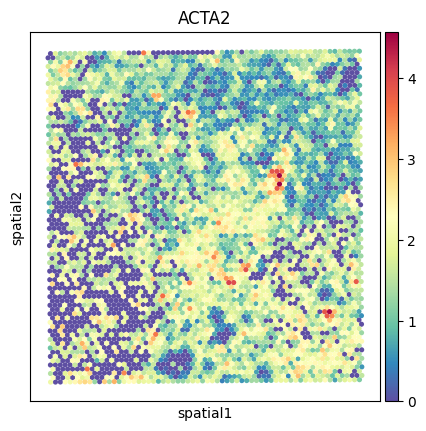

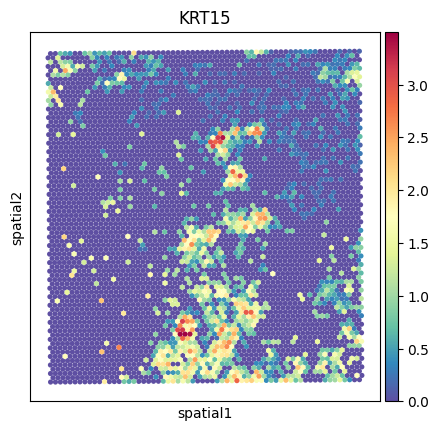

In [30]:
sc.pl.spatial(adata, img_key=None, color="ACTA2", size=1.5, title="ACTA2", cmap='Spectral_r')
sc.pl.spatial(adata, img_key=None, color="KRT15", size=1.5, title="KRT15", cmap='Spectral_r')

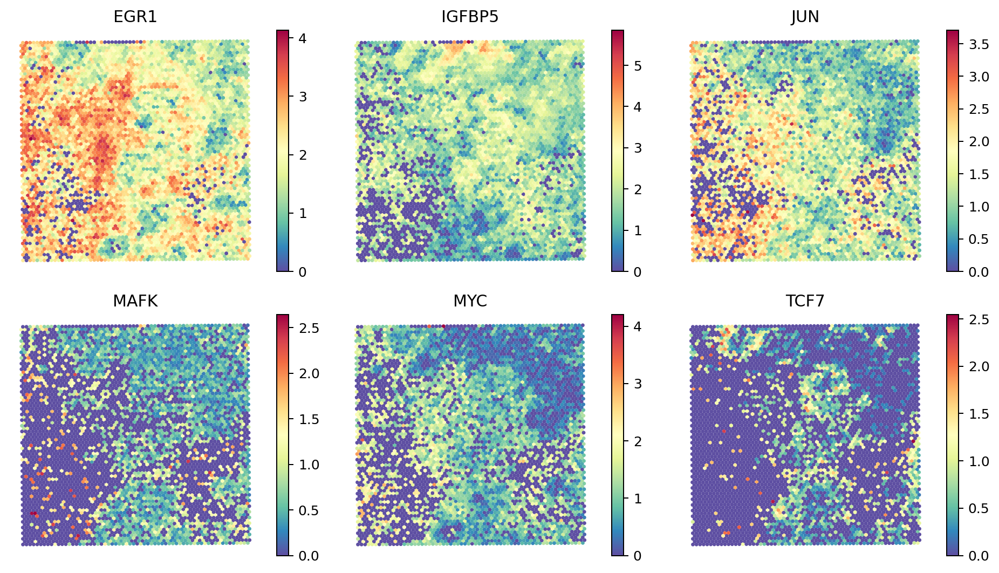

In [ ]:
########################################
# plot gene
########################################
n_genes = len(gene_marker['PRSmarker'])  # Number of genes
n_cols = 3  # Number of columns
n_rows = (n_genes + n_cols - 1) // n_cols  # Number of rows


fig, axes = plt.subplots(n_rows, n_cols, figsize=(3.5 * n_cols, 3 * n_rows), dpi=180)

axes = axes.flatten()

for i, gene_name in enumerate(gene_marker['PRSmarker']):
    ax = axes[i]
    try:
        scatter  = ax.scatter(adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1], c=adata.to_df()[gene_name],  
                              cmap='Spectral_r',s=3)
        ax.set_title(gene_name)
        plt.colorbar(scatter, ax=ax) 
    except KeyError:
        ax.set_title(f"{gene_name} not found")
        plt.colorbar(scatter, ax=ax) 
        print(f"Warning: {gene_name} not found in data.")
    ax.invert_yaxis()
    ax.axis('off')

# for i in range(n_genes, len(axes)):
    # axes[i].axis('off')

plt.tight_layout()

plt.savefig(f'{path}/CNetRCPH/gene_expr.png', transparent=True, format='png', dpi=300, bbox_inches='tight')
plt.show()

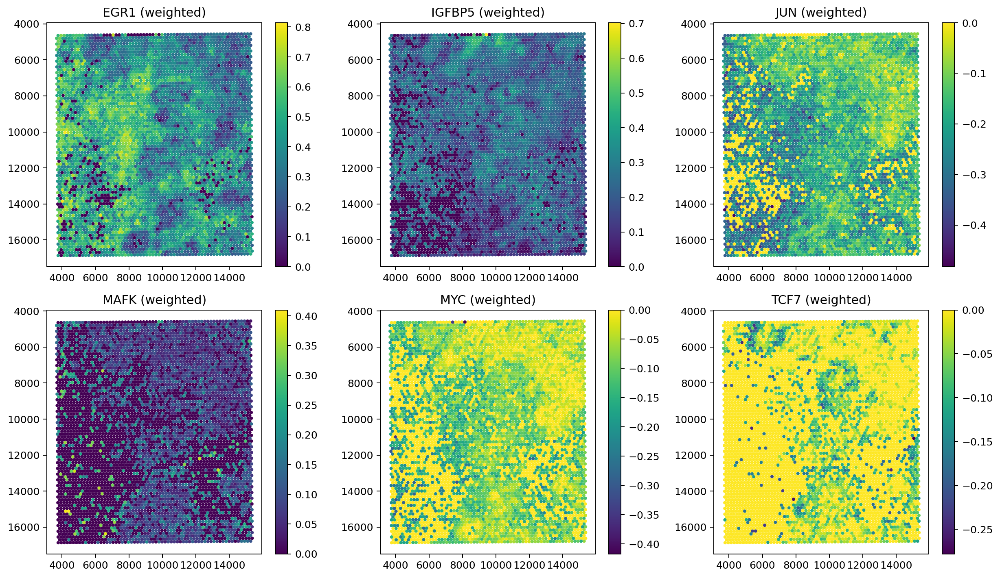

In [ ]:
########################################
# plot weight*gene
########################################
n_genes = len(gene_marker['PRSmarker'])
n_cols = 3  # Set the number of columns
n_rows = (n_genes + n_cols - 1) // n_cols  # Calculate the number of rows

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.6 * n_cols, 4 * n_rows), dpi=180)
axes = axes.flatten()  # Flatten the axes array

# Loop through each gene
for i, gene_name in enumerate(gene_marker['PRSmarker']):
    ax = axes[i]
    try:
        # Check if the gene exists in the weights dictionary
        if gene_name in gene_weights:
            # Calculate weighted expression values
            weighted_expression = adata.to_df()[gene_name] * gene_weights[gene_name]
            scatter = ax.scatter(adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1], c=weighted_expression, s=5)
            ax.set_title(f"{gene_name} (weighted)")
        else:
            raise KeyError(f"{gene_name} weight not found")

        plt.colorbar(scatter, ax=ax)
    except KeyError as e:
        ax.set_title(str(e))
        print(f"Warning: {str(e)}")

    ax.invert_yaxis()  # Invert the Y-axis


plt.tight_layout()
plt.show()

In [10]:
score_df, score_norm_df = meta_score(adata, gene_weights, 'PRSscore')
print(score_df.head())
print(score_norm_df.head())

                    PRSscore
AACACCTACTATCGAA-1  0.295075
AACACGTGCATCGCAC-1  0.341652
AACACTTGGCAAGGAA-1  0.308778
AACAGGAAGAGCATAG-1  0.369513
AACAGGATTCATAGTT-1  0.827751
                    PRSscore_norm
AACACCTACTATCGAA-1       0.505692
AACACGTGCATCGCAC-1       0.530526
AACACTTGGCAAGGAA-1       0.512999
AACAGGAAGAGCATAG-1       0.545381
AACAGGATTCATAGTT-1       0.789702


In [11]:
adata.obs = pd.concat([adata.obs, score_df, score_norm_df], axis=1)
adata.obs

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,PRSscore,PRSscore_norm
AACACCTACTATCGAA-1,1,0,122,6022,8.703341,12675.0,9.447466,14.879684,19.439842,25.199211,36.157791,430.0,6.066108,3.392505,0.295075,0.505692
AACACGTGCATCGCAC-1,1,76,22,3979,8.289037,7886.0,8.972971,25.145828,29.710880,35.417195,46.981993,193.0,5.267858,2.447375,0.341652,0.530526
AACACTTGGCAAGGAA-1,1,47,71,9017,9.106978,32614.0,10.392528,13.233581,17.704053,23.247685,33.264856,709.0,6.565265,2.173913,0.308778,0.512999
AACAGGAAGAGCATAG-1,1,69,7,4183,8.339023,7484.0,8.920656,17.784607,22.354356,28.206841,40.245858,215.0,5.375278,2.872795,0.369513,0.545381
AACAGGATTCATAGTT-1,1,49,43,3693,8.214465,6694.0,8.809116,20.062743,25.186734,31.700030,43.964745,280.0,5.638355,4.182850,0.827751,0.789702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTTGGAACGAGGTCA-1,1,28,72,4910,8.499233,10678.0,9.276034,17.372167,23.318974,29.780858,41.693201,202.0,5.313206,1.891740,0.684341,0.713239
TGTTGGAAGCTCGGTA-1,1,1,95,9582,9.167746,36253.0,10.498305,14.931178,18.773619,23.548396,33.009682,1154.0,7.051856,3.183185,0.155340,0.431189
TGTTGGATGGACTTCT-1,1,13,53,9972,9.207637,52039.0,10.859768,17.729011,21.854763,26.720344,36.278560,4883.0,8.493720,9.383347,0.373713,0.547620
TGTTGGCCAGACCTAC-1,1,49,47,3997,8.293550,7627.0,8.939581,22.735020,27.874656,33.643634,45.076701,302.0,5.713733,3.959617,0.288209,0.502032


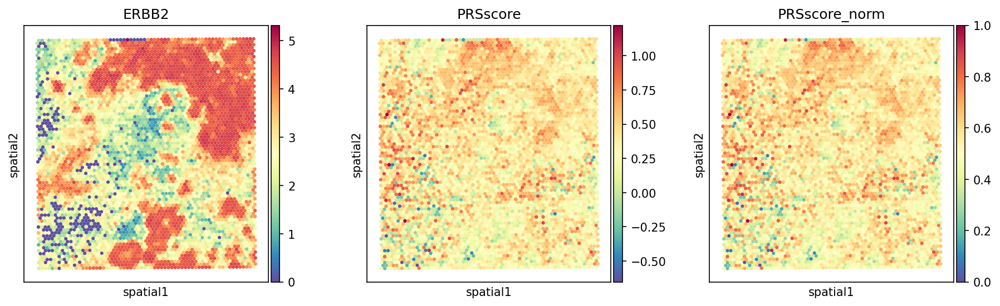

In [26]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4), dpi=150)

# Plotting spatial data for each score on the prepared axes
sc.pl.spatial(adata, img_key=None, color="SCGB2A2", size=1.5, title="SCGB2A2", cmap='Spectral_r', show=False, ax=ax[0])
sc.pl.spatial(adata, img_key=None, color="PRSscore", size=1.5, title="PRSscore", cmap='Spectral_r', show=False, ax=ax[1])
sc.pl.spatial(adata, img_key=None, color="PRSscore_norm", size=1.5, title="PRSscore_norm", cmap='Spectral_r', show=False, ax=ax[2])

plt.show()
# fig.savefig(f'{path}/PRS_distribution.pdf', format='pdf', dpi=300, bbox_inches='tight')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
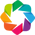

SpatailDM version: 0.2.0
{'regist_target_img_scalef': 0.2781512, 'tissue_hires_scalef': 0.092717074, 'tissue_lowres_scalef': 0.027815122, 'fiducial_diameter_fullres': 191.75371240966362, 'spot_diameter_fullres': 127.8358082731091}


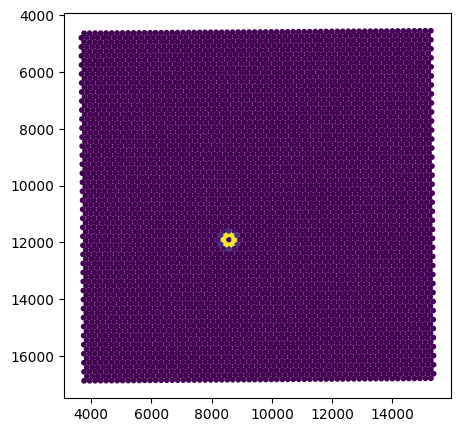

In [ ]:
import spatialdm as sdm
import matplotlib.pyplot as plt
print("SpatailDM version: %s" %sdm.__version__)


scale_factors = adata.uns['spatial']['CytAssist_FFPE_Human_Breast_Cancer']['scalefactors']
print(scale_factors)
spot_diameter_fullres = scale_factors['spot_diameter_fullres']
fst.weight_matrix(adata, l = spot_diameter_fullres,
                  cutoff = 0.001, single_cell = False, n_nearest_neighbors=6)

## Visualize the range of interaction
plt.figure(figsize=(5, 5))
plt.scatter(adata.obsm['spatial'][:,0], adata.obsm['spatial'][:,1],
            c=adata.obsp['weight'].A[500], s=10)
plt.gca().invert_yaxis()
# plt.savefig(f"Figures/{dataset}weight_matrix_neibor.pdf", format='pdf', dpi=300, bbox_inches='tight')

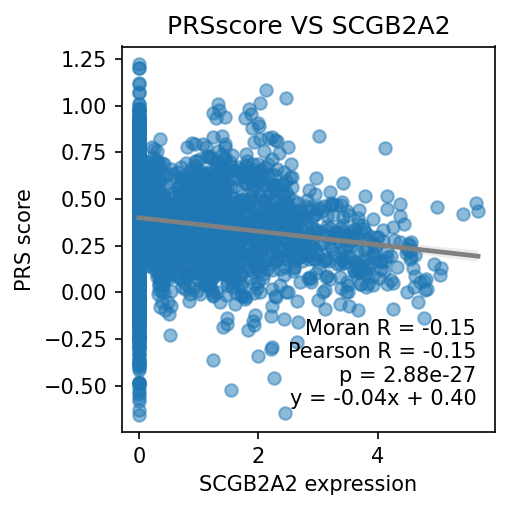

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression

# Calculate R and p values
r, p = pearsonr(adata.to_df()['SCGB2A2'], adata.obs['PRSscore'])
X = np.array(adata.to_df()['SCGB2A2']).reshape(-1, 1)
Y = np.array(adata.obs['PRSscore'])
R = sdm.utils.Moran_R(X.flatten(), Y, adata.obsp['weight'])[0].item()

# Fit a linear regression model to get the coefficients
model = LinearRegression().fit(X, Y)
slope = model.coef_[0]
intercept = model.intercept_

# Set up the figure
fig, ax = plt.subplots(figsize=(3.5, 3.5), dpi=150)

# Use seaborn's regplot to add the regression line and confidence interval
sns.regplot(x=adata.to_df()['SCGB2A2'], y=adata.obs['PRSscore'], ax=ax, scatter_kws={'alpha':0.5}, line_kws={'color':'gray'})

# Position text in the bottom right
text_string = (
    f'Moran R = {R:.2f}\n'
    f'Pearson R = {r:.2f}\np = {p:.2e}\n'
    f'y = {slope:.2f}x + {intercept:.2f}\n'
)
ax.text(0.95, 0.00, text_string, color='black', horizontalalignment='right', verticalalignment='bottom', transform=ax.transAxes)

# Set titles and labels
ax.set_title('PRSscore VS SCGB2A2')
ax.set_xlabel('SCGB2A2 expression')
ax.set_ylabel('PRS score')

# Show the plot
plt.tight_layout()
plt.savefig(f'{path}/CNetRCPH/_coor_DCSI1.svg', format='svg', transparent=True, bbox_inches='tight')
plt.show()

In [13]:
adata.obs = pd.concat([adata.obs, anno], axis=1)
adata.obs

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,PRSscore,PRSscore_norm,Cluster,Annotation
AACACCTACTATCGAA-1,1,0,122,6022,8.703341,12675.0,9.447466,14.879684,19.439842,25.199211,36.157791,430.0,6.066108,3.392505,0.295075,0.505692,1,stromal/endothelial
AACACGTGCATCGCAC-1,1,76,22,3979,8.289037,7886.0,8.972971,25.145828,29.710880,35.417195,46.981993,193.0,5.267858,2.447375,0.341652,0.530526,5,stromal/endothelial
AACACTTGGCAAGGAA-1,1,47,71,9017,9.106978,32614.0,10.392528,13.233581,17.704053,23.247685,33.264856,709.0,6.565265,2.173913,0.308778,0.512999,12,mixed
AACAGGAAGAGCATAG-1,1,69,7,4183,8.339023,7484.0,8.920656,17.784607,22.354356,28.206841,40.245858,215.0,5.375278,2.872795,0.369513,0.545381,2,stromal/endothelial/immune
AACAGGATTCATAGTT-1,1,49,43,3693,8.214465,6694.0,8.809116,20.062743,25.186734,31.700030,43.964745,280.0,5.638355,4.182850,0.827751,0.789702,5,stromal/endothelial
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTTGGAACGAGGTCA-1,1,28,72,4910,8.499233,10678.0,9.276034,17.372167,23.318974,29.780858,41.693201,202.0,5.313206,1.891740,0.684341,0.713239,8,stromal
TGTTGGAAGCTCGGTA-1,1,1,95,9582,9.167746,36253.0,10.498305,14.931178,18.773619,23.548396,33.009682,1154.0,7.051856,3.183185,0.155340,0.431189,9,immune
TGTTGGATGGACTTCT-1,1,13,53,9972,9.207637,52039.0,10.859768,17.729011,21.854763,26.720344,36.278560,4883.0,8.493720,9.383347,0.373713,0.547620,4,invasive
TGTTGGCCAGACCTAC-1,1,49,47,3997,8.293550,7627.0,8.939581,22.735020,27.874656,33.643634,45.076701,302.0,5.713733,3.959617,0.288209,0.502032,5,stromal/endothelial


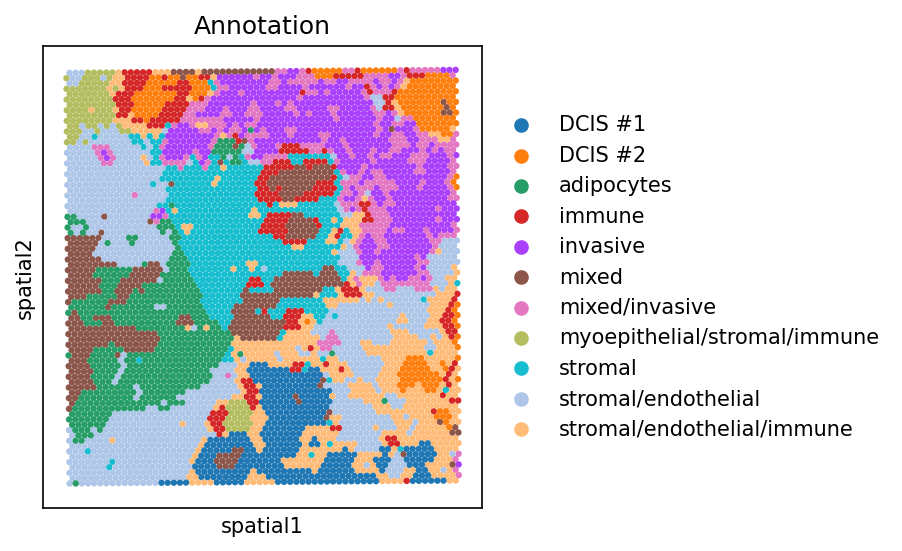

In [42]:
os.chdir(f'{path}CNetRCPH/')
fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=150)
sc.pl.spatial(adata, img_key=None, color="Annotation", size=1.5, title="Annotation", ax=ax)
# fig.savefig(f'{path}/CNetRCPH/celltype.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.show()

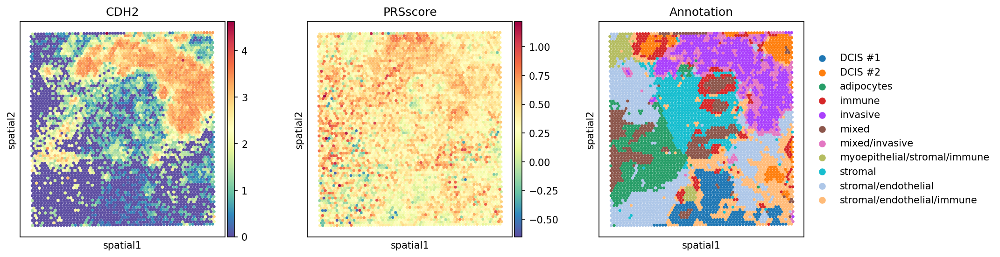

In [43]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4), dpi=150)

# Plotting spatial data for each score on the prepared axes
sc.pl.spatial(adata, img_key=None, color="SCGB2A2", size=1.5, title="SCGB2A2", cmap='Spectral_r', show=False, ax=ax[0])
sc.pl.spatial(adata, img_key=None, color="PRSscore", size=1.5, title="PRSscore", cmap='Spectral_r', show=False, ax=ax[1])
sc.pl.spatial(adata, img_key=None, color="Annotation", size=1.5, title="Annotation", show=False, ax=ax[2])

plt.show()
# fig.savefig(f'Figures/{dataset}celltype_sele.pdf', format='pdf', dpi=300, bbox_inches='tight')

In [14]:
def get_oncotype_subgroups(adata):
    adata_inva = adata[adata.obs['Annotation'] == 'invasive']
    print(adata_inva)
    adata_dcsi1 = adata[adata.obs['Annotation'] == 'DCIS #1']
    print(adata_dcsi1)
    adata_dcsi2 = adata[adata.obs['Annotation'] == 'DCIS #2']
    print(adata_dcsi2)
    return adata_inva, adata_dcsi1, adata_dcsi2

adata_inva, adata_dcsi1, adata_dcsi2 = get_oncotype_subgroups(adata)

View of AnnData object with n_obs × n_vars = 599 × 18031
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'PRSscore', 'PRSscore_norm', 'Cluster', 'Annotation'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial', 'log1p', 'single_cell'
    obsm: 'spatial'
    obsp: 'weight', 'nearest_neighbors'
View of AnnData object with n_obs × n_vars = 344 × 18031
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'p

In [15]:
adata_dcsi2.obs['PRSscore']

AACCACTAACATGATT-1    0.285373
AACCTACCTACCGGTT-1    0.349027
AAGATTCTGGTCGCGA-1    0.450619
AAGCCACGCATAATGA-1    0.437509
AAGCCATCGCGATATG-1    0.210444
                        ...   
TGGTTGGATTGAGCTG-1    0.425543
TGTAGGAGCTTCAATA-1    0.471583
TGTATGGAACTACGCA-1    0.081678
TGTCATGTGACACGCT-1    0.366396
TGTCTACTAGATTGCC-1    0.288241
Name: PRSscore, Length: 210, dtype: float64

In [141]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import mannwhitneyu

def plot_score_boxplot(
    adata_dcsi1, adata_dcsi2, adata_inva, 
    score_col='OncotypeDX21score', 
    # palette=['#B9DDD7', '#E8B0B4', '#B6A1D3'],
    palette = ['#8EB5CF', '#F1BB92', '#DF9494'],
    figsize=(3/1.5, 4/1.5),
    save_path=None,
    tick_fontsize=12
):
    """
    Draw boxplots of the score for three groups and show statistical significance.

    Parameters:
        adata_dcsi1, adata_dcsi2, adata_inva: AnnData or DataFrame subsets
        score_col: column name for the score
        colors: color palette for boxplots
        figsize: figure size
        save_path: if not None, save figure to this path
        tick_fontsize: fontsize of axis tick labels
    """

    # Extract scores
    PRSscore_dcsi1 = adata_dcsi1.obs[score_col]
    PRSscore_dcsi2 = adata_dcsi2.obs[score_col]
    PRSscore_inva = adata_inva.obs[score_col]

    # Build DataFrame for plotting
    data = pd.DataFrame({
        'DCIS 1': PRSscore_dcsi1,
        'DCIS 2': PRSscore_dcsi2,
        'Invasive': PRSscore_inva
    })

    # Statistical tests
    pairs = [('DCIS 1', 'DCIS 2'), ('DCIS 1', 'Invasive'), ('DCIS 2', 'Invasive')]
    p_values = []
    for g1, g2 in pairs:
        stat, p = mannwhitneyu(data[g1].dropna(), data[g2].dropna())
        p_values.append(p)
    
    # Plot
    plt.figure(figsize=figsize)
    ax = sns.boxplot(data=data, palette=palette)
    plt.title(f'{score_col} Across Different Conditions')
    plt.ylabel(score_col.replace('_', ' '))
    plt.xticks(fontsize=tick_fontsize)
    plt.yticks(fontsize=tick_fontsize)
    plt.tight_layout()

    # Add significance stars
    y_max = data.max().max()
    y_min = data.min().min()
    h = (y_max - y_min) * 0.08  # height for annotation lines
    y_start = y_max + h
    for i, ((g1, g2), p) in enumerate(zip(pairs, p_values)):
        x1, x2 = list(data.columns).index(g1), list(data.columns).index(g2)
        y = y_start + i*h
        ax.plot([x1, x1, x2, x2], [y, y+h/2, y+h/2, y], lw=1.2, c='k')
        if p < 0.001:
            star = '***'
        elif p < 0.01:
            star = '**'
        elif p < 0.05:
            star = '*'
        else:
            star = 'n.s.'
        ax.text((x1+x2)/2, y+h/2, star, ha='center', va='bottom', fontsize=tick_fontsize, color='k')

    if save_path is not None:
        plt.savefig(save_path, transparent=True, format='pdf', dpi=300, bbox_inches='tight')
    plt.show()

    # Print p-values
    print(f"P-value between DCIS 1 and DCIS 2: {p_values[0]}")
    print(f"P-value between DCIS 1 and Invasive: {p_values[1]}")
    print(f"P-value between DCIS 2 and Invasive: {p_values[2]}")

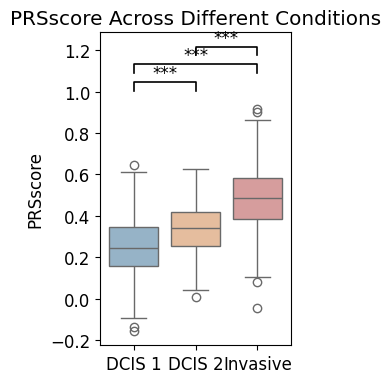

P-value between DCIS 1 and DCIS 2: 2.7200123609110745e-12
P-value between DCIS 1 and Invasive: 1.7414720327290266e-84
P-value between DCIS 2 and Invasive: 3.839131970536109e-36


In [143]:
plot_score_boxplot(adata_dcsi1, adata_dcsi2, adata_inva, 
                   score_col='PRSscore', figsize=(3, 4),
                  #  save_path='PRS_score_boxplot.pdf')
                   save_path=None)

In [139]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import itertools
from scipy.stats import ttest_ind

def plot_violin_box_strip(adata_list, labels, variable_name, value_property='PRSscore', fig_size=(5, 6), 
                          test_property='t_test', font_size=14, save_path=None):
    # Extract data and create DataFrame
    data_frames = [pd.DataFrame({label: adata.obs[value_property]}) for adata, label in zip(adata_list, labels)]
    df = pd.concat(data_frames, axis=1)

    # Reshape the DataFrame for plotting
    df_melt = pd.melt(df.reset_index(), id_vars='index', value_vars=labels, 
                      var_name='Method', value_name=value_property)

    # Configuration
    # palette = ['#B9DDD7', '#E8B0B4', '#B6A1D3']
    palette = ['#8EB5CF', '#F1BB92', '#DF9494']
    shift = 0.15
    pairs = list(itertools.combinations(labels, 2))

    fig, ax = plt.subplots(figsize=fig_size)

    # Create half-violin plot
    violin_parts = sns.violinplot(x='Method', y=value_property, data=df_melt, inner=None, palette=palette, width=0.5)

    # Modify violin patches to keep only the right half
    for vp in violin_parts.collections[::1]:
        for path in vp.get_paths():
            vertices = path.vertices
            vertices[:, 0] = np.clip(vertices[:, 0], np.median(vertices[:, 0]), np.inf)
            vertices[:, 0] += shift

    # Create box plot
    sns.boxplot(x='Method', y=value_property, data=df_melt, width=0.3, fliersize=0.0, linewidth=1.0,
                boxprops={'edgecolor': 'gray'}, palette=palette, showcaps=True, whiskerprops={'linewidth': 1.5},
                capprops={'linewidth': 1.5}, medianprops={'color': 'gray'})

    # Add strip plot
    sns.stripplot(x='Method', y=value_property, data=df_melt, jitter=True, size=2, color=".6", linewidth=0)

    # Statistical Test
    y, h, col = df_melt[value_property].max() + 0.05, 0.05, 'k'
    for i, (method1, method2) in enumerate(pairs):
        method1_values = df_melt[df_melt['Method'] == method1][value_property].dropna()
        method2_values = df_melt[df_melt['Method'] == method2][value_property].dropna()

        if test_property == 't_test':
            _, p_value = ttest_ind(method1_values, method2_values)
            x1, x2 = labels.index(method1), labels.index(method2)
            plt.plot([x1, x1, x2, x2], [y + (h * i), y + h + (h * i), y + h + (h * i), y + (h * i)], lw=1.0, c=col)
            plt.text((x1 + x2) * .5, y + h + (h * i), f'p = {p_value:.2e}', ha='center', va='bottom', color=col)
        y += h    

    # Set axis labels and title
    ax.set_ylabel(value_property, fontsize=font_size)
    # plt.subplots_adjust()
    # ax.tick_params(axis='both', which='major', labelsize=font_size)
    # plt.xticks(rotation=25)
    plt.gcf().set_dpi(150)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    if save_path is not None:
        plt.savefig(save_path, transparent=True, format='pdf', dpi=300, bbox_inches='tight')

    plt.show()

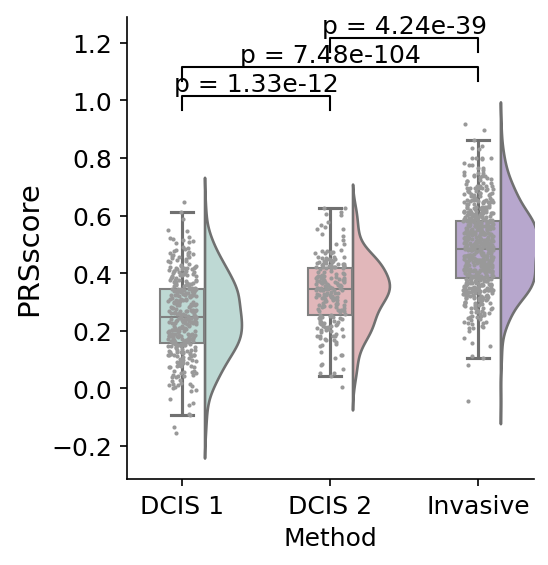

In [ ]:
adata_list = [adata_dcsi1, adata_dcsi2, adata_inva]
labels = ['DCIS 1', 'DCIS 2', 'Invasive']
variable_name = ['DCIS 1', 'DCIS 2', 'Invasive'] 

os.chdir(f'{path}CNetRCPH/')
plot_violin_box_strip(adata_list, labels, variable_name, value_property='PRSscore', 
                      fig_size=(3.5, 4), test_property='t_test', font_size=14, 
                      save_path=None)
                      # save_path='PRS_score.pdf')

## OncotypeDX21gene

In [36]:
anno_OncotypeDX21 = pd.read_csv(f'{path}CNetRCPH/OncotypeDX21gene.csv')['OncotypeDX21gene']
print(anno_OncotypeDX21.shape)
anno_OncotypeDX21

gene_weights_OncotypeDX21 = {gene: 1 for gene in anno_OncotypeDX21}
gene_weights_OncotypeDX21

score_df_OncotypeDX21, score_norm_df_OncotypeDX21 = meta_score(adata, gene_weights_OncotypeDX21, 'OncotypeDX21score')
print(score_df_OncotypeDX21.head())
print(score_norm_df_OncotypeDX21.head())

(21,)
                    OncotypeDX21score
AACACCTACTATCGAA-1           8.238409
AACACGTGCATCGCAC-1           8.377954
AACACTTGGCAAGGAA-1          12.818812
AACAGGAAGAGCATAG-1           9.517202
AACAGGATTCATAGTT-1           9.930911
                    OncotypeDX21score_norm
AACACCTACTATCGAA-1                0.511382
AACACGTGCATCGCAC-1                0.520044
AACACTTGGCAAGGAA-1                0.795701
AACAGGAAGAGCATAG-1                0.590761
AACAGGATTCATAGTT-1                0.616441


In [37]:
adata.obs = pd.concat([adata.obs, score_df_OncotypeDX21, score_norm_df_OncotypeDX21], axis=1)
adata.obs

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,PRSscore,PRSscore_norm,Cluster,Annotation,OncotypeDX21score,OncotypeDX21score_norm
AACACCTACTATCGAA-1,1,0,122,6022,8.703341,12675.0,9.447466,14.879684,19.439842,25.199211,36.157791,430.0,6.066108,3.392505,0.295075,0.505692,1,stromal/endothelial,8.238409,0.511382
AACACGTGCATCGCAC-1,1,76,22,3979,8.289037,7886.0,8.972971,25.145828,29.710880,35.417195,46.981993,193.0,5.267858,2.447375,0.341652,0.530526,5,stromal/endothelial,8.377954,0.520044
AACACTTGGCAAGGAA-1,1,47,71,9017,9.106978,32614.0,10.392528,13.233581,17.704053,23.247685,33.264856,709.0,6.565265,2.173913,0.308778,0.512999,12,mixed,12.818812,0.795701
AACAGGAAGAGCATAG-1,1,69,7,4183,8.339023,7484.0,8.920656,17.784607,22.354356,28.206841,40.245858,215.0,5.375278,2.872795,0.369513,0.545381,2,stromal/endothelial/immune,9.517202,0.590761
AACAGGATTCATAGTT-1,1,49,43,3693,8.214465,6694.0,8.809116,20.062743,25.186734,31.700030,43.964745,280.0,5.638355,4.182850,0.827751,0.789702,5,stromal/endothelial,9.930911,0.616441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTTGGAACGAGGTCA-1,1,28,72,4910,8.499233,10678.0,9.276034,17.372167,23.318974,29.780858,41.693201,202.0,5.313206,1.891740,0.684341,0.713239,8,stromal,8.956004,0.555925
TGTTGGAAGCTCGGTA-1,1,1,95,9582,9.167746,36253.0,10.498305,14.931178,18.773619,23.548396,33.009682,1154.0,7.051856,3.183185,0.155340,0.431189,9,immune,11.122389,0.690399
TGTTGGATGGACTTCT-1,1,13,53,9972,9.207637,52039.0,10.859768,17.729011,21.854763,26.720344,36.278560,4883.0,8.493720,9.383347,0.373713,0.547620,4,invasive,9.473403,0.588042
TGTTGGCCAGACCTAC-1,1,49,47,3997,8.293550,7627.0,8.939581,22.735020,27.874656,33.643634,45.076701,302.0,5.713733,3.959617,0.288209,0.502032,5,stromal/endothelial,9.905217,0.614846


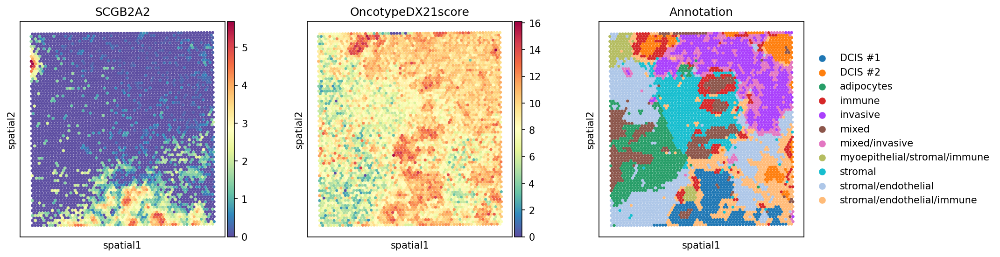

In [35]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4), dpi=150)

# Plotting spatial data for each score on the prepared axes
sc.pl.spatial(adata, img_key=None, color="SCGB2A2", size=1.5, title="SCGB2A2", cmap='Spectral_r', show=False, ax=ax[0])
sc.pl.spatial(adata, img_key=None, color="OncotypeDX21score", size=1.5, title="OncotypeDX21score", cmap='Spectral_r', show=False, ax=ax[1])
sc.pl.spatial(adata, img_key=None, color="Annotation", size=1.5, title="Annotation", show=False, ax=ax[2])

plt.show()
# fig.savefig(f'Figures/{dataset}celltype_sele.pdf', format='pdf', dpi=300, bbox_inches='tight')

In [38]:
adata_inva_OncotypeDX21, adata_dcsi1_OncotypeDX21, adata_dcsi2_OncotypeDX21 = get_oncotype_subgroups(adata)

View of AnnData object with n_obs × n_vars = 599 × 18031
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'PRSscore', 'PRSscore_norm', 'Cluster', 'Annotation', 'OncotypeDX21score', 'OncotypeDX21score_norm'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial', 'log1p', 'single_cell'
    obsm: 'spatial'
    obsp: 'weight', 'nearest_neighbors'
View of AnnData object with n_obs × n_vars = 344 × 18031
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_to

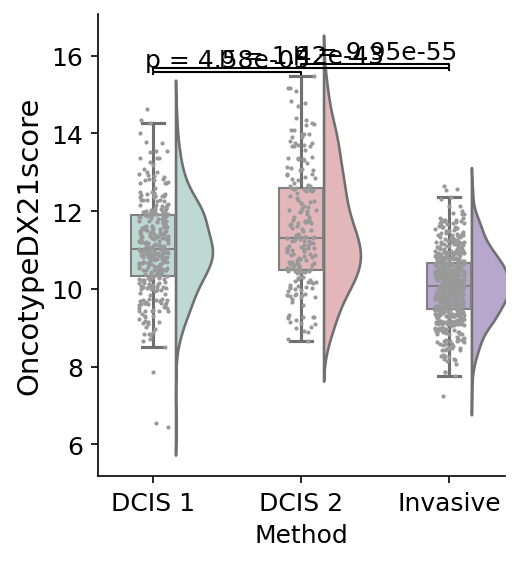

In [40]:
adata_list_OncotypeDX21 = [adata_dcsi1_OncotypeDX21, adata_dcsi2_OncotypeDX21, adata_inva_OncotypeDX21]
labels = ['DCIS 1', 'DCIS 2', 'Invasive']
variable_name = ['DCIS 1', 'DCIS 2', 'Invasive'] 

os.chdir(f'{path}CNetRCPH/')
plot_violin_box_strip(adata_list_OncotypeDX21, labels, variable_name, value_property='OncotypeDX21score', 
                      fig_size=(3.5, 4), test_property='t_test', font_size=14, 
                      save_path=None)
                    #   save_path='PRS_score_OncotypeDX21.pdf')

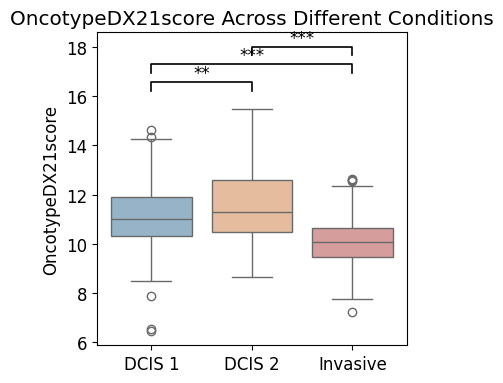

P-value between DCIS 1 and DCIS 2: 0.0029215679661375666
P-value between DCIS 1 and Invasive: 6.86111455810227e-39
P-value between DCIS 2 and Invasive: 8.008358879724865e-36


In [146]:
plot_score_boxplot(adata_dcsi1_OncotypeDX21, adata_dcsi2_OncotypeDX21, adata_inva_OncotypeDX21, 
                   score_col='OncotypeDX21score', figsize=(4, 4),   
                #    save_path=None)
                   save_path='OncotypeDX21_score_boxplot.pdf')

## Mamaprint

In [42]:
anno_mama = pd.read_csv(f'{path}CNetRCPH/70_mama.csv')['x']
print(anno_mama.shape)
anno_mama

gene_weights_mama = {gene: 1 for gene in anno_mama}
gene_weights_mama

score_df_mama, score_norm_df_mama = meta_score(adata, gene_weights_mama, 'Mamaprintscore')
print(score_df_mama.head())
print(score_norm_df_mama.head())

adata.obs = pd.concat([adata.obs, score_df_mama, score_norm_df_mama], axis=1)
adata.obs

(70,)
                    Mamaprintscore
AACACCTACTATCGAA-1       14.272941
AACACGTGCATCGCAC-1       16.763705
AACACTTGGCAAGGAA-1       17.705282
AACAGGAAGAGCATAG-1       16.817069
AACAGGATTCATAGTT-1       15.245632
                    Mamaprintscore_norm
AACACCTACTATCGAA-1             0.468624
AACACGTGCATCGCAC-1             0.550403
AACACTTGGCAAGGAA-1             0.581318
AACAGGAAGAGCATAG-1             0.552155
AACAGGATTCATAGTT-1             0.500560


,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,...,log1p_total_counts_mt,pct_counts_mt,PRSscore,PRSscore_norm,Cluster,Annotation,OncotypeDX21score,OncotypeDX21score_norm,Mamaprintscore,Mamaprintscore_norm
AACACCTACTATCGAA-1,1,0,122,6022,8.703341,12675.0,9.447466,14.879684,19.439842,25.199211,...,6.066108,3.392505,0.295075,0.505692,1,stromal/endothelial,8.238409,0.511382,14.272941,0.468624
AACACGTGCATCGCAC-1,1,76,22,3979,8.289037,7886.0,8.972971,25.145828,29.710880,35.417195,...,5.267858,2.447375,0.341652,0.530526,5,stromal/endothelial,8.377954,0.520044,16.763705,0.550403
AACACTTGGCAAGGAA-1,1,47,71,9017,9.106978,32614.0,10.392528,13.233581,17.704053,23.247685,...,6.565265,2.173913,0.308778,0.512999,12,mixed,12.818812,0.795701,17.705282,0.581318
AACAGGAAGAGCATAG-1,1,69,7,4183,8.339023,7484.0,8.920656,17.784607,22.354356,28.206841,...,5.375278,2.872795,0.369513,0.545381,2,stromal/endothelial/immune,9.517202,0.590761,16.817069,0.552155
AACAGGATTCATAGTT-1,1,49,43,3693,8.214465,6694.0,8.809116,20.062743,25.186734,31.700030,...,5.638355,4.182850,0.827751,0.789702,5,stromal/endothelial,9.930911,0.616441,15.245632,0.500560
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTTGGAACGAGGTCA-1,1,28,72,4910,8.499233,10678.0,9.276034,17.372167,23.318974,29.780858,...,5.313206,1.891740,0.684341,0.713239,8,stromal,8.956004,0.555925,20.366790,0.668703
TGTTGGAAGCTCGGTA-1,1,1,95,9582,9.167746,36253.0,10.498305,14.931178,18.773619,23.548396,...,7.051856,3.183185,0.155340,0.431189,9,immune,11.122389,0.690399,25.549765,0.838876
TGTTGGATGGACTTCT-1,1,13,53,9972,9.207637,52039.0,10.859768,17.729011,21.854763,26.720344,...,8.493720,9.383347,0.373713,0.547620,4,invasive,9.473403,0.588042,22.794760,0.748421
TGTTGGCCAGACCTAC-1,1,49,47,3997,8.293550,7627.0,8.939581,22.735020,27.874656,33.643634,...,5.713733,3.959617,0.288209,0.502032,5,stromal/endothelial,9.905217,0.614846,9.975567,0.327528


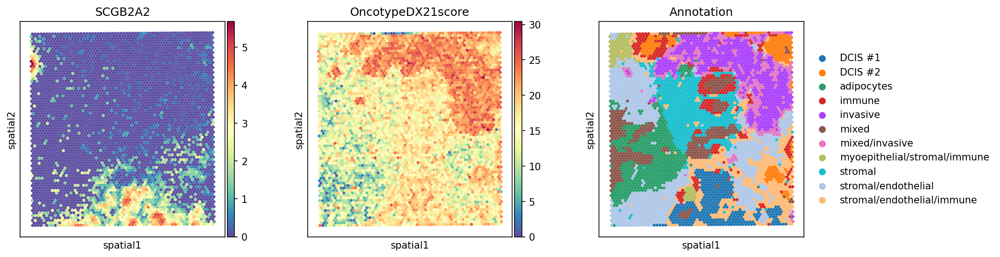

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4), dpi=150)

# Plotting spatial data for each score on the prepared axes
sc.pl.spatial(adata, img_key=None, color="SCGB2A2", size=1.5, title="SCGB2A2", cmap='Spectral_r', show=False, ax=ax[0])
sc.pl.spatial(adata, img_key=None, color="Mamaprintscore", size=1.5, title="Mamaprintscore", cmap='Spectral_r', show=False, ax=ax[1])
sc.pl.spatial(adata, img_key=None, color="Annotation", size=1.5, title="Annotation", show=False, ax=ax[2])

plt.show()
fig.savefig(f'{path}CNetRCPH/celltype_sele_mama.pdf', format='pdf', dpi=300, bbox_inches='tight')

In [44]:
adata_inva_mama, adata_dcsi1_mama, adata_dcsi2_mama = get_oncotype_subgroups(adata)


View of AnnData object with n_obs × n_vars = 599 × 18031
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'PRSscore', 'PRSscore_norm', 'Cluster', 'Annotation', 'OncotypeDX21score', 'OncotypeDX21score_norm', 'Mamaprintscore', 'Mamaprintscore_norm'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial', 'log1p', 'single_cell'
    obsm: 'spatial'
    obsp: 'weight', 'nearest_neighbors'
View of AnnData object with n_obs × n_vars = 344 × 18031
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_c

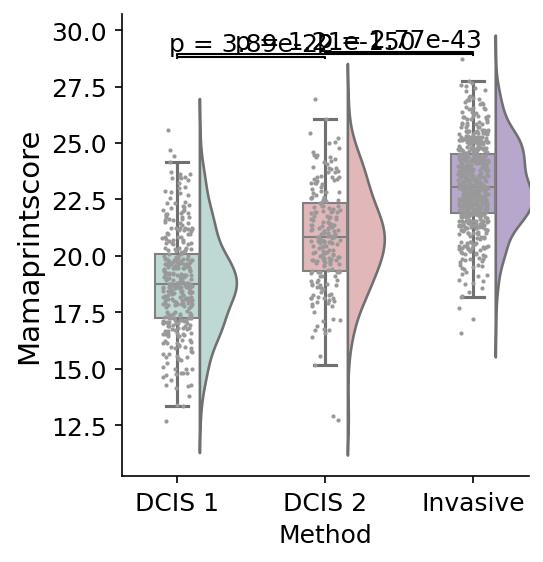

In [48]:
adata_list_mama = [adata_dcsi1_mama, adata_dcsi2_mama, adata_inva_mama]
labels = ['DCIS 1', 'DCIS 2', 'Invasive']
variable_name = ['DCIS 1', 'DCIS 2', 'Invasive'] 

os.chdir(f'{path}CNetRCPH/')
plot_violin_box_strip(adata_list_mama, labels, variable_name, value_property='Mamaprintscore', 
                      fig_size=(3.5, 4), test_property='t_test', font_size=14, 
                      save_path=None)
                    #   save_path=f'{path}CNetRCPH/PRS_score_Mama.pdf')

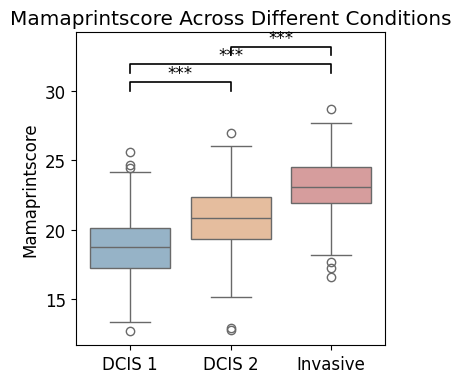

P-value between DCIS 1 and DCIS 2: 7.827687708169534e-22
P-value between DCIS 1 and Invasive: 2.3911050320631267e-106
P-value between DCIS 2 and Invasive: 1.0064515319248106e-35


In [145]:
plot_score_boxplot(adata_dcsi1_mama, adata_dcsi2_mama, adata_inva_mama, 
                   score_col='Mamaprintscore', figsize=(4, 4),   
                   save_path=None)
                #    save_path='Mama_score_boxplot.pdf')

In [54]:
print(adata_dcsi1.obs['PRSscore'])
print(adata_dcsi1_mama.obs['Mamaprintscore'])
print(adata_dcsi1_OncotypeDX21.obs['OncotypeDX21score'])

AACATCTAATGACCGG-1    0.043421
AACCGTGCTTATGTTG-1    0.163276
AACCTTAGCGTCCGGT-1    0.043055
AACTAGCGCTCCAGTT-1    0.130529
AACTATCGTCATAGTC-1    0.405506
                        ...   
TGTCAACTTATTCAAT-1    0.184178
TGTCACAGACGTATCC-1   -0.135076
TGTCAGTGGCTTCCAT-1    0.386817
TGTCCGATAGTCACAG-1    0.292780
TGTCGATTCACGTAGT-1    0.007857
Name: PRSscore, Length: 344, dtype: float64
AACATCTAATGACCGG-1    17.437298
AACCGTGCTTATGTTG-1    18.807390
AACCTTAGCGTCCGGT-1    19.657816
AACTAGCGCTCCAGTT-1    18.112529
AACTATCGTCATAGTC-1    15.960090
                        ...    
TGTCAACTTATTCAAT-1    17.440464
TGTCACAGACGTATCC-1    19.526891
TGTCAGTGGCTTCCAT-1    17.410339
TGTCCGATAGTCACAG-1    13.382680
TGTCGATTCACGTAGT-1    12.670677
Name: Mamaprintscore, Length: 344, dtype: float64
AACATCTAATGACCGG-1    11.494706
AACCGTGCTTATGTTG-1    11.585802
AACCTTAGCGTCCGGT-1     9.429328
AACTAGCGCTCCAGTT-1    11.408114
AACTATCGTCATAGTC-1     9.521790
                        ...    
TGTCAACTTATTCAAT-1   

In [81]:
adata_dcsi1.obs['PRSscore'].mean()

0.25129476929676914

In [ ]:
def concat_scores(adata1, adata2, adata3, score_name):
    return pd.concat([adata1.obs[score_name], adata2.obs[score_name], adata3.obs[score_name]], axis=0)

prs = concat_scores(adata_dcsi1, adata_dcsi2, adata_inva, 'PRSscore')
mama = concat_scores(adata_dcsi1_mama, adata_dcsi2_mama, adata_inva_mama, 'Mamaprintscore')
oncotype = concat_scores(adata_dcsi1_OncotypeDX21, adata_dcsi2_OncotypeDX21, adata_inva_OncotypeDX21, 'OncotypeDX21score')

## Calculate Pearson correlation coefficient
corr_prs_mama = prs.corr(mama, method='pearson')
corr_prs_onco = prs.corr(oncotype, method='pearson')

print(f"Correlation between PRSscore and Mamaprintscore: {corr_prs_mama}")
print(f"Correlation between PRSscore and OncotypeDX21score: {corr_prs_onco}")

## Calculate Spearman correlation coefficient
corr_prs_mama_s = prs.corr(mama, method='spearman')
corr_prs_onco_s = prs.corr(oncotype, method='spearman')

print(f"Spearman correlation between PRSscore and Mamaprintscore: {corr_prs_mama_s}")
print(f"Spearman correlation between PRSscore and OncotypeDX21score: {corr_prs_onco_s}")

Correlation between PRSscore and Mamaprintscore: 0.44239303770659394
Correlation between PRSscore and OncotypeDX21score: -0.2120122830220971
Spearman correlation between PRSscore and Mamaprintscore: 0.45409806939974734
Spearman correlation between PRSscore and OncotypeDX21score: -0.2259938297376096


In [ ]:
## Analyzing mean correlation
def mean_scores(*adatas, score_name):
    return pd.Series([ad.obs[score_name].mean() for ad in adatas])

prs_mean = mean_scores(adata_dcsi1, adata_dcsi2, adata_inva, score_name='PRSscore')
mama_mean = mean_scores(adata_dcsi1_mama, adata_dcsi2_mama, adata_inva_mama, score_name='Mamaprintscore')
oncotype_mean = mean_scores(adata_dcsi1_OncotypeDX21, adata_dcsi2_OncotypeDX21, adata_inva_OncotypeDX21, score_name='OncotypeDX21score')

print(prs_mean.corr(mama_mean, method='pearson'))
print(prs_mean.corr(oncotype_mean, method='pearson'))
print(prs_mean)

0.9934579577424321
-0.7735667833544615
0    0.251295
1    0.334962
2    0.484877
dtype: float64


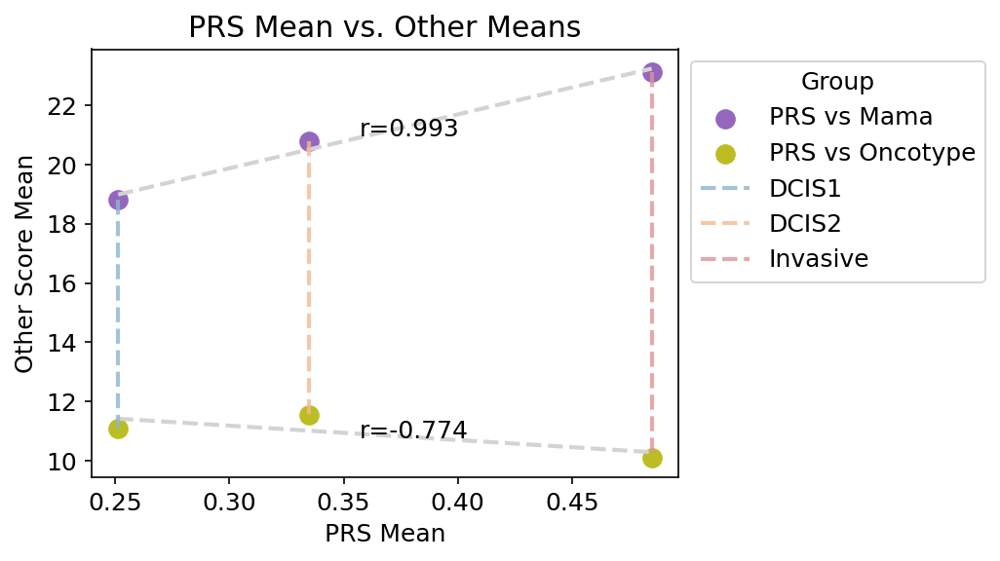

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.stats import pearsonr

groups = ['DCIS1', 'DCIS2', 'Invasive']
palette = ['#8EB5CF', '#F1BB92', '#DF9494']

x = np.array(prs_mean)
y1 = np.array(mama_mean)
y2 = np.array(oncotype_mean)

plt.figure(figsize=(7,4), dpi=150)


plt.scatter(x, y1, label='PRS vs Mama', color='tab:purple', s=80)
plt.scatter(x, y2, label='PRS vs Oncotype', color='tab:olive', s=80)

## Scatter plot
for y, color, name, offset in zip(
    [y1, y2], 
    ['lightgrey', 'lightgrey'], 
    ['Mama', 'Oncotype'],
    [0.05, -0.15]  # Control the vertical position of labels
):
    model = LinearRegression()
    model.fit(x.reshape(-1, 1), y)
    y_pred = model.predict(x.reshape(-1, 1))
    ## Fitted line
    plt.plot(x, y_pred, color=color, lw=2, linestyle='--')
    ## Correlation coefficient
    r, p = pearsonr(x, y)
    mid_x = np.mean(x)
    mid_y = model.predict([[mid_x]])[0]
    plt.text(
        mid_x, mid_y+offset, 
        f'r={r:.3f}', 
        color='black', 
        # ha='center', va='center'
    )

## Dashed line
for i in range(len(x)):
    plt.plot([x[i], x[i]], [y1[i], y2[i]], ls='--', color=palette[i], alpha=0.8, lw=2, 
             label=groups[i])

plt.xlabel('PRS Mean')
plt.ylabel('Other Score Mean')
plt.title('PRS Mean vs. Other Means')
plt.legend(title='Group', loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
# plt.savefig(f'{path}CNetRCPH/mean_scores_correlation_with_fit_lable.pdf', format='pdf', transparent=True, bbox_inches='tight')
plt.show()

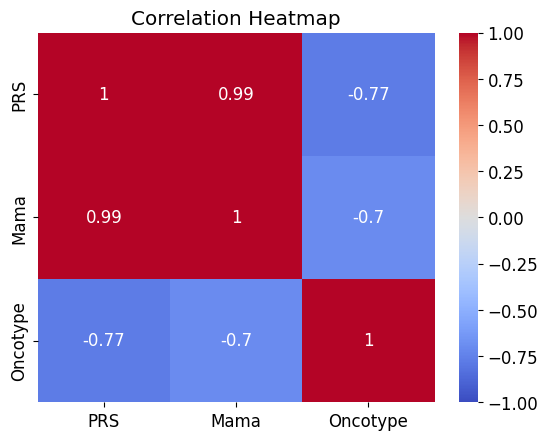

In [90]:
import seaborn as sns

corr = pd.DataFrame({'PRS': prs_mean, 'Mama': mama_mean, 'Oncotype': oncotype_mean}).corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()
